In [4]:
# Import packages
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

In [5]:
# Load the provided datasets
df2021 = pd.read_csv('data\\daily-shelter-overnight-service-occupancy-capacity-2021.csv')
df2022 = pd.read_csv('data\\daily-shelter-overnight-service-occupancy-capacity-2022.csv')
df2023 = pd.read_csv('data\\daily_shelter_overnight_occupancy.csv')

df2022['OCCUPANCY_DATE'] = pd.to_datetime(df2022['OCCUPANCY_DATE'], format='%y-%m-%d').dt.strftime('%Y-%m-%d')
df2021['OCCUPANCY_DATE'] = pd.to_datetime(df2021['OCCUPANCY_DATE'], format='%y-%m-%d').dt.strftime('%Y-%m-%d')

# Combine the datasets for 2021 and 2022
df = pd.concat([df2021, df2022])

# Ensure OCCUPANCY_DATE is in datetime format
df['OCCUPANCY_DATE'] = pd.to_datetime(df['OCCUPANCY_DATE'])

# Filter the DataFrame for entries in the years 2021 and 2022
df_2021_2022 = df[df['OCCUPANCY_DATE'].dt.year.isin([2021, 2022])]

# Group by LOCATION_ID and year, then count unique months for each group
monthly_data_count = df_2021_2022.groupby(['LOCATION_ID', df_2021_2022['OCCUPANCY_DATE'].dt.year])['OCCUPANCY_DATE'].apply(lambda x: x.dt.month.nunique()).reset_index(name='unique_month_count')

# Identify LOCATION_IDs that have less than 12 unique months of data in either year
location_ids_with_insufficient_data = monthly_data_count[(monthly_data_count['unique_month_count'] < 12)].groupby('LOCATION_ID')['LOCATION_ID'].unique().apply(list).sum()

# Filter the original DataFrame to exclude these LOCATION_IDs
df = df[~df['LOCATION_ID'].isin(location_ids_with_insufficient_data)]

# Additionally, filter out shelters that do not have data in 2023
# Assuming df2023 is your DataFrame for 2023
df2023['OCCUPANCY_DATE'] = pd.to_datetime(df2023['OCCUPANCY_DATE'])
location_ids_2023 = df2023['LOCATION_ID'].unique()
df = df[df['LOCATION_ID'].isin(location_ids_2023)]

# Grouping by OCCUPANCY_DATE and LOCATION_ID to find the max SERVICE_USER_COUNT for each location per day
max_service_users_per_day = df.groupby(['OCCUPANCY_DATE', 'LOCATION_ID'])['SERVICE_USER_COUNT'].max().reset_index()

# Filtering out locations with a max SERVICE_USER_COUNT < 30 for each day
filtered_max_service_users = max_service_users_per_day[max_service_users_per_day['SERVICE_USER_COUNT'] >= 30]

# Merging the filtered data back with the original df to retain only the relevant entries
df_filtered = df.merge(filtered_max_service_users, on=['OCCUPANCY_DATE', 'LOCATION_ID', 'SERVICE_USER_COUNT'])

# Combine the datasets for 2021 and 2022
combined_df = pd.concat([df2021, df2022, df2023])

# # # Filter the original DataFrame to include only these LOCATION_IDs
combined_df = combined_df[combined_df['LOCATION_ID'].isin(location_ids_2023)]

# # # Filter out locations not in Toronto
combined_df = combined_df[combined_df['LOCATION_POSTAL_CODE'].str.startswith('M', na=False)]

# # Filtering out shelters with max SERVICE_USER_COUNT < 30 for each day
# combined_filtered_df = combined_df.groupby(['OCCUPANCY_DATE', 'LOCATION_ID']).agg({'SERVICE_USER_COUNT': 'max'}).reset_index()
# combined_filtered_df = combined_filtered_df[combined_filtered_df.groupby('OCCUPANCY_DATE')['SERVICE_USER_COUNT'].transform('max') >= 30]

# # Re-aggregating the data after filtering
# combined_df = combined_df[combined_df['LOCATION_ID'].isin(combined_filtered_df['LOCATION_ID'].unique())]

combined_df['OCCUPANCY_DATE'] = pd.to_datetime(combined_df['OCCUPANCY_DATE'], format='%Y-%m-%d')


In [6]:
# read in predicted values data
deep_learn = pd.read_csv('open_eval_fixed.csv')
quantile_forest = pd.read_csv('shelter.csv')

In [7]:
# fix date format
deep_learn['OCCUPANCY_DATE'] = pd.to_datetime(deep_learn['OCCUPANCY_DATE'], format='%Y-%m-%d')

deep_learn.head()

,Unnamed: 0,OCCUPANCY_DATE,SHELTER_ID,LOCATION_ID,SERVICE_USER_COUNT,V0,V1,V2,V3,V4,...,MONTH,DAY,SECTOR_Families,SECTOR_Men,SECTOR_Mixed Adult,SECTOR_Women,SECTOR_Youth,prog_mod,cap_type,PREDICTED_SERVICE_USER_COUNT
0,0,2023-01-01,40,1320.0,614,45.109763,-26.429409,-11.817578,0.742323,1.522050,...,1,1,1,0,0,0,0,1,0,614.0
1,1,2023-01-01,40,1320.0,111,45.109763,-26.429409,-11.817578,0.742323,1.522050,...,1,1,0,0,1,0,0,1,0,111.0
2,2,2023-01-01,40,1051.0,8,-32.387651,6.342944,8.746248,-0.691179,-1.240342,...,1,1,0,0,1,0,0,1,1,8.0
3,3,2023-01-01,22,1172.0,39,15.507206,23.830506,-16.849640,-5.835434,-0.485904,...,1,1,0,1,0,0,0,1,0,39.0
4,4,2023-01-01,22,1029.0,39,19.094184,8.044583,-4.705973,-14.409033,-1.286280,...,1,1,0,1,0,0,0,1,1,39.0


In [8]:
# create date column for predicted values
quantile_forest['OCCUPANCY_DATE'] = pd.to_datetime(quantile_forest[['year', 'month', 'day']])
quantile_forest.sort_values(by=['OCCUPANCY_DATE'], inplace=True)

quantile_forest.head()

,LOCATION_ID,year,month,day,LAT,LON,SERVICE_USER_COUNT,SERVICE_USER_COUNT_PRED,OCCUPANCY_DATE
27234,1167.0,2023,1,1,43.646220,-79.383074,89,84.6775,2023-01-01
19566,1198.0,2023,1,1,43.646970,-79.393208,12,12.3575,2023-01-01
8966,1148.0,2023,1,1,43.637561,-79.424092,52,42.4000,2023-01-01
5613,1220.0,2023,1,1,43.770038,-79.301033,83,14.1475,2023-01-01
2035,1048.0,2023,1,1,43.659977,-79.378375,32,19.0200,2023-01-01


In [9]:
def get_location_name(location_id):
    return combined_df[combined_df['LOCATION_ID'] == location_id]['LOCATION_NAME'].unique()[0]

def plot_forecast_for_models_per_location(location_id):

    location_name = get_location_name(location_id)

    actual = combined_df[combined_df['LOCATION_ID'] == location_id]
    predicted_qf = quantile_forest[quantile_forest['LOCATION_ID'] == location_id]
    predicted_dl = deep_learn[deep_learn['LOCATION_ID'] == location_id]

    actual = actual[['LOCATION_ID', 'OCCUPANCY_DATE', 'SERVICE_USER_COUNT']].groupby(['LOCATION_ID', 'OCCUPANCY_DATE']).agg('sum').reset_index()
    predicted_qf = predicted_qf[['LOCATION_ID', 'OCCUPANCY_DATE', 'SERVICE_USER_COUNT', 'SERVICE_USER_COUNT_PRED']].groupby(['LOCATION_ID', 'OCCUPANCY_DATE']).agg('sum').reset_index()
    predicted_dl = predicted_dl[['LOCATION_ID', 'OCCUPANCY_DATE', 'SERVICE_USER_COUNT', 'PREDICTED_SERVICE_USER_COUNT']].groupby(['LOCATION_ID', 'OCCUPANCY_DATE']).agg('sum').reset_index()

    # Set up the figure and axis for plotting with a specified size.
    plt.figure(figsize=(14, 7))

    # Plot the observed data in blue.
    plt.plot(actual['OCCUPANCY_DATE'], actual['SERVICE_USER_COUNT'], label='Observed')

    # Plot the forecasted data in red.
    plt.plot(predicted_qf['OCCUPANCY_DATE'], predicted_qf['SERVICE_USER_COUNT_PRED'], color='red', label='Quantile Forest')

    # Plot the forecasted data in red.
    plt.plot(predicted_dl['OCCUPANCY_DATE'], predicted_dl['PREDICTED_SERVICE_USER_COUNT'], color='green', label='Deep Learning')

    # Add a legend to the plot for clarity.
    plt.legend()

    # Add a title to the plot.
    plt.title(f'Forecast of Overall Service Users at {location_name} (Location {int(location_id)}) using different models')

    # Display the plot.
    plt.show()
    
    # Save plots.
    # plt.savefig(f'plots\\location_{location_id}.png')


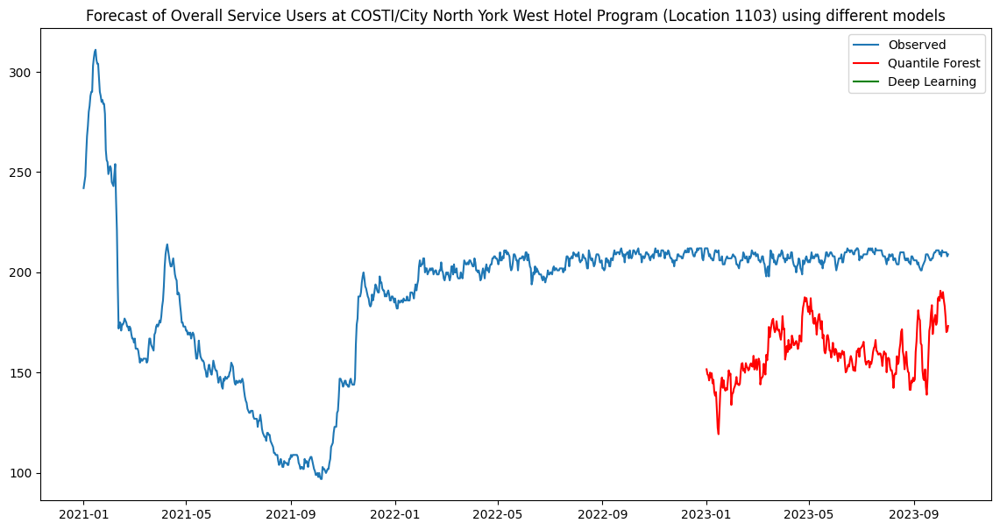

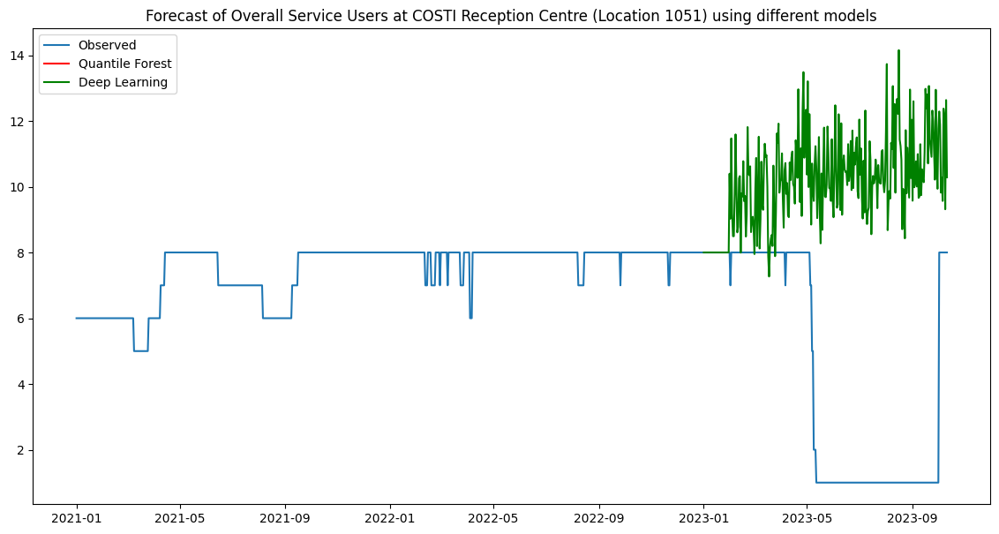

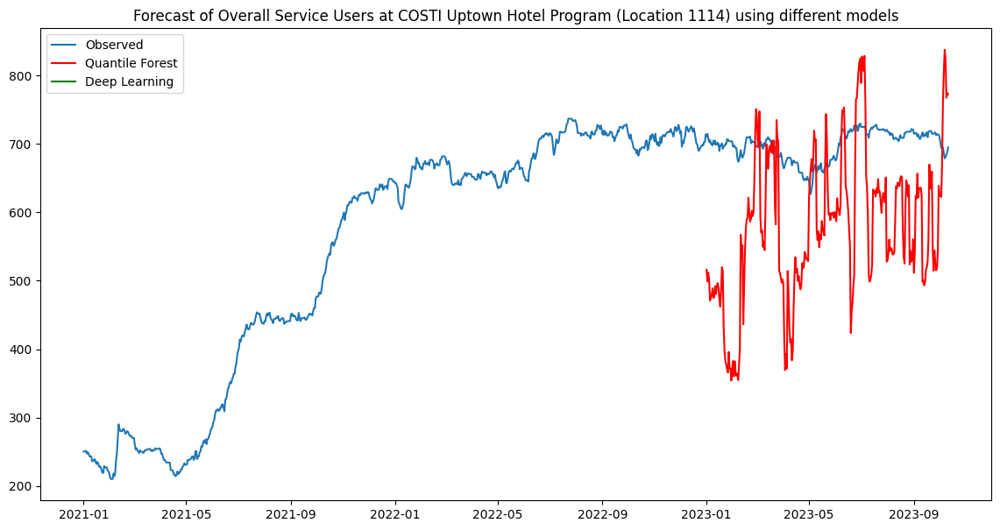

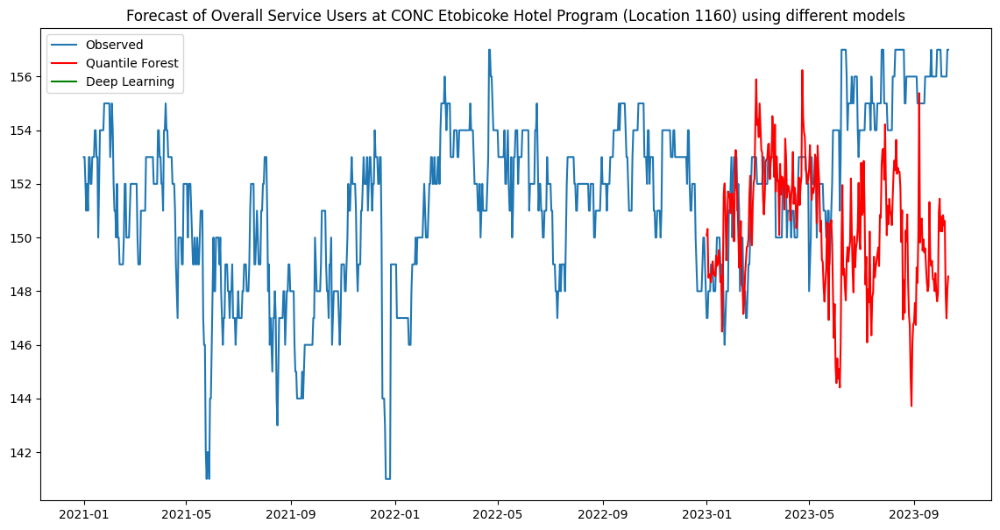

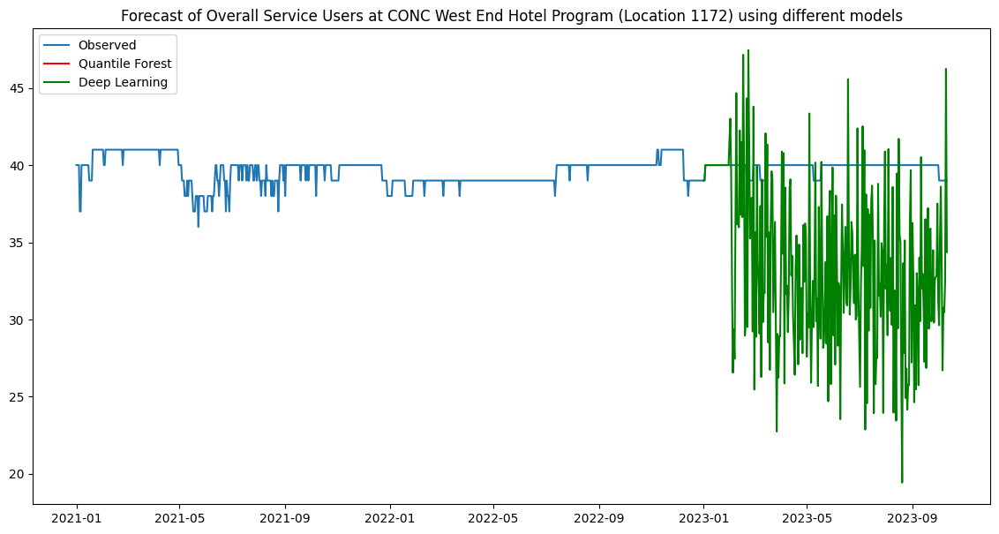

...

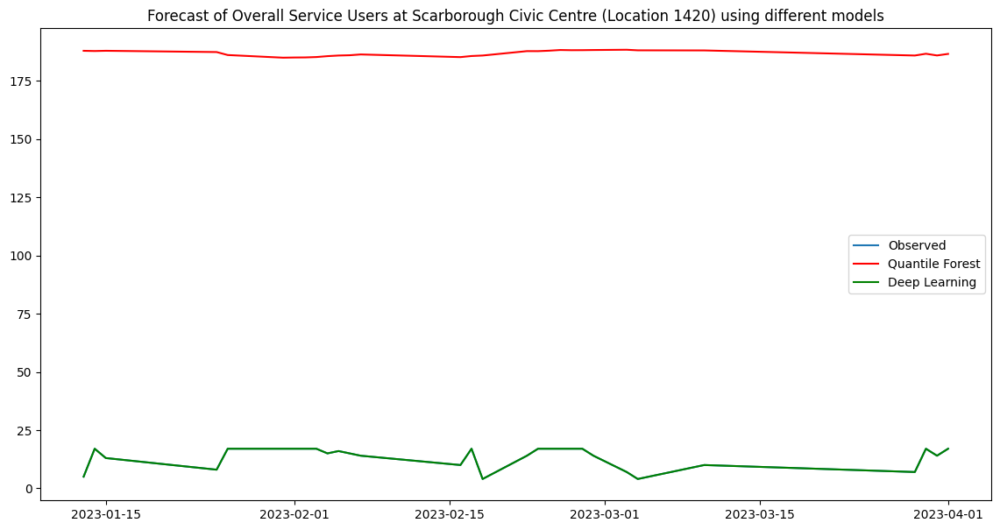

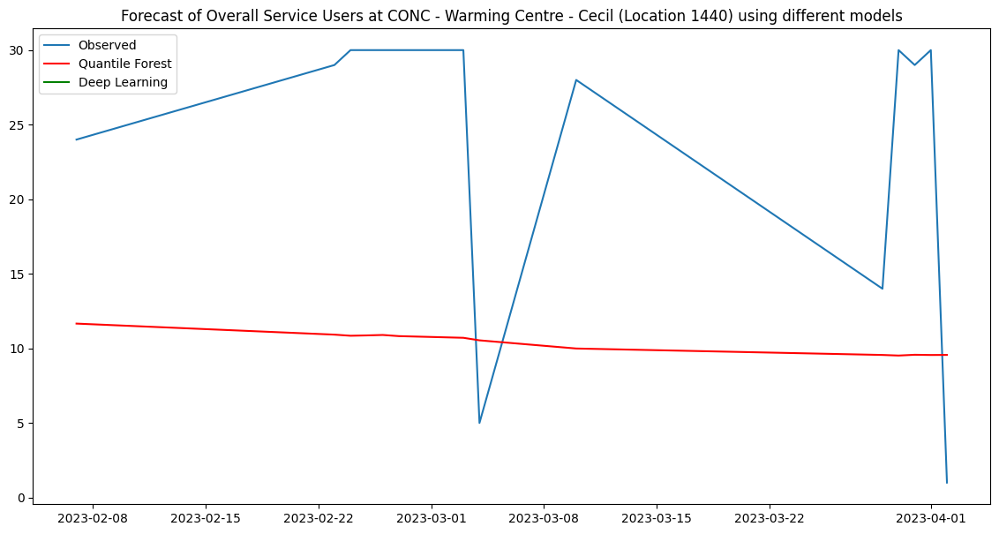

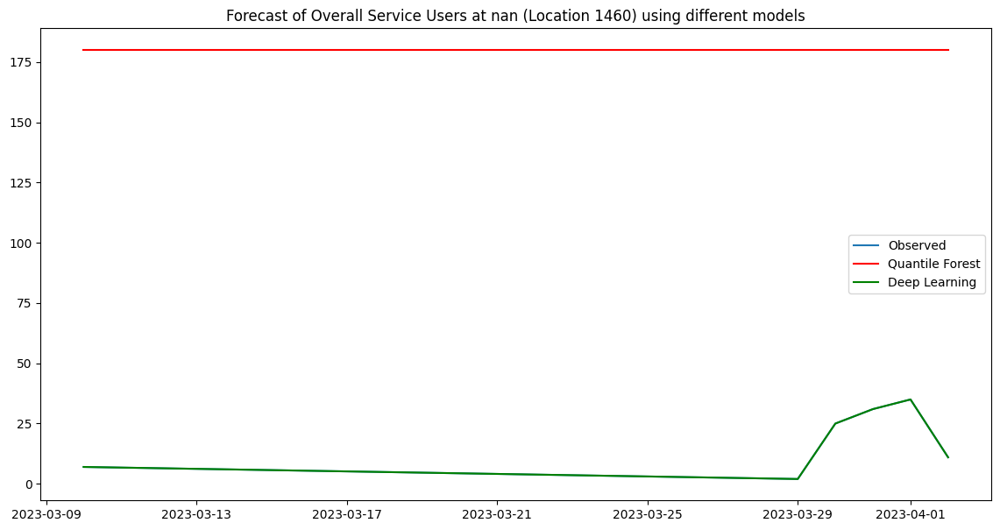

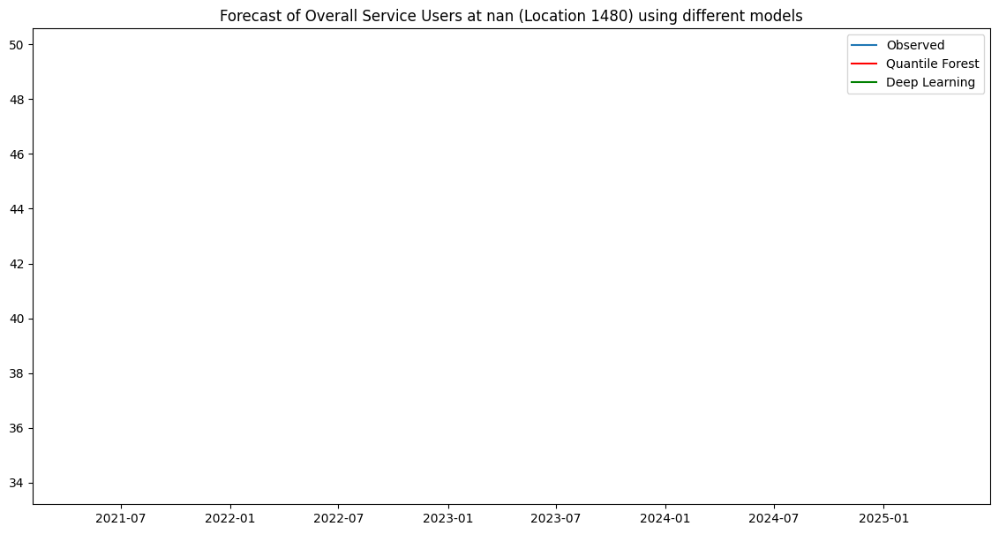

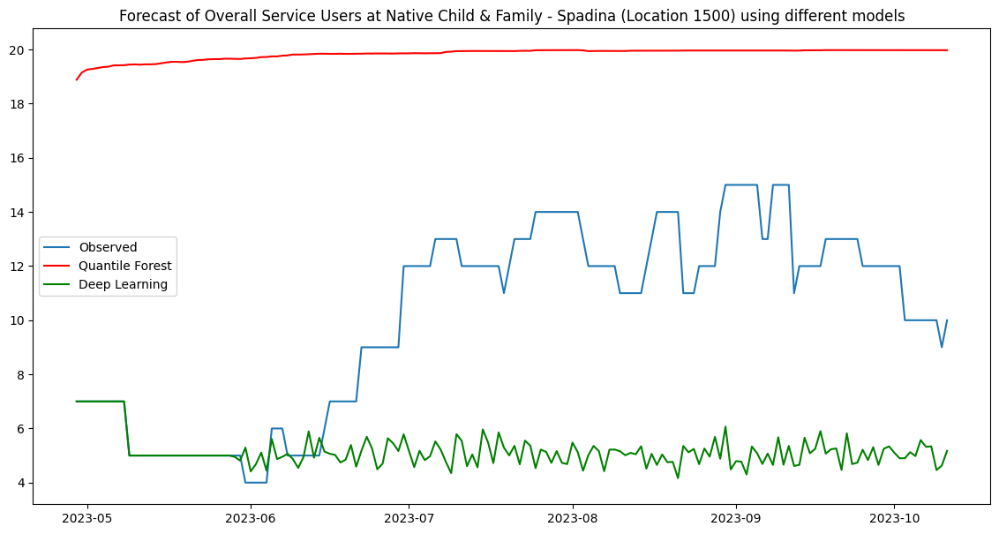

In [10]:
for location_id in combined_df['LOCATION_ID'].unique():
    plot_forecast_for_models_per_location(location_id)

In [11]:
mse = mean_squared_error(deep_learn['SERVICE_USER_COUNT'], deep_learn['PREDICTED_SERVICE_USER_COUNT'])
mse

28850.302187171146

In [12]:
combined_df[combined_df['LOCATION_ID'] == 1103]['LOCATION_CITY']

0        North York 
1        North York 
2        North York 
3        North York 
4        North York 
            ...     
37578     North York
37702     North York
37703     North York
37704     North York
37705     North York
Name: LOCATION_CITY, Length: 4548, dtype: object

In [13]:
quantile_forest[quantile_forest['LOCATION_ID'] == 1051]

,LOCATION_ID,year,month,day,LAT,LON,SERVICE_USER_COUNT,SERVICE_USER_COUNT_PRED,OCCUPANCY_DATE


In [14]:
deep_learn[deep_learn['LOCATION_ID'] == 1103]

,Unnamed: 0,OCCUPANCY_DATE,SHELTER_ID,LOCATION_ID,SERVICE_USER_COUNT,V0,V1,V2,V3,V4,...,MONTH,DAY,SECTOR_Families,SECTOR_Men,SECTOR_Mixed Adult,SECTOR_Women,SECTOR_Youth,prog_mod,cap_type,PREDICTED_SERVICE_USER_COUNT
